In [1]:
## -- System dependencies --
import sys, os, gc
import torch

## -- Device-Agnostic for GPU --
if torch.cuda.is_available():
    print(f"ℹ️ Device GPU: {torch.cuda.get_device_name(0)}")
    print(f"ℹ️ No. of CPU: {os.cpu_count()} cores")
    # get_ipython().run_line_magic('load_ext', 'cudf.pandas')
    # get_ipython().run_line_magic('load_ext', 'cuml.accel')
    # from cuml.preprocessing import TargetEncoder as cuTE
else:
    print(f"ℹ️ Device: CPU {os.cpu_count()} cores")

ℹ️ Device: CPU 4 cores


In [2]:
## -- Data Manipulation --
import numpy as np, pandas as pd, random

## -- Visualization --
from IPython.display import display, Image
import matplotlib.pyplot as plt
import seaborn as sns
import shap

## -- Functional Tools --
from time import time, sleep
from tqdm.notebook import tqdm
import itertools

import tensorflow as tf

## -- Machine Learning --
import sklearn
from sklearn.calibration import CalibratedClassifierCV, CalibrationDisplay
from sklearn.metrics import roc_auc_score, ConfusionMatrixDisplay, RocCurveDisplay
from sklearn.model_selection import KFold, StratifiedKFold, GroupKFold, train_test_split

import warnings

2026-05-24 13:25:40.571657: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1779629140.797018      16 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1779629140.865547      16 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1779629141.408991      16 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1779629141.409041      16 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1779629141.409044      16 computation_placer.cc:177] computation placer alr

In [3]:
## -- Global Settings --

# sklearn.set_config(transform_output="pandas")
warnings.simplefilter('ignore')
warnings.filterwarnings('ignore')

## -- Set Global Seed --
class CFG():
    SEED   = 42
    GREEN  = '\033[32m'
    YELLOW = '\033[33m'
    RESET  = '\033[0m'

tf.keras.utils.set_random_seed(CFG.SEED)

# pd.options.mode.copy_on_write = True
pd.set_option('display.max_columns', 1000)
sns.set_style("whitegrid")
# plt.style.use('ggplot')

plt.rcParams.update({
    'figure.facecolor': '#0f0f1a', # Outer panel (figure)
    'axes.facecolor':   '#1a1a2e', # Inner panel (plot)
    'axes.edgecolor':   '#444466',
    'axes.labelcolor':  '#e0e0ff',
    'text.color':       'lightblue',
    'xtick.color':      '#e0e0ff',
    'ytick.color':      '#e0e0ff',
    'grid.color':       '#2a2a4a',
    'grid.alpha':       0.5,
    'font.family':      'monospace',
})

PALETTE = ['c', 'r', 'darkorange', '#3A86FF', 'y']
sns.set_palette(PALETTE)
cmap = sns.diverging_palette(0, 230, 90, 60, as_cmap=True)

print(f"CLASSIC {CFG.GREEN} GREEN {CFG.RESET} {CFG.YELLOW} YELLOW {CFG.RESET}")

CLASSIC  GREEN   YELLOW 


In [4]:
## -- ⚠️ IMPORTANT: SELECT PLATFORM ⚠️ --
PLATFORM = 'kaggle' # -> 'colab' 'kaggle'

if PLATFORM == 'kaggle':
    PATH = '/kaggle/input/competitions/playground-series-s6e5/'
    submit = pd.read_csv(PATH+'sample_submission.csv')
    train = pd.read_csv(PATH+"train.csv").drop(columns=['id'])
    test = pd.read_csv(PATH+"test.csv").drop(columns=['id'])
    ORIG_PATH = '/kaggle/input/datasets/aadigupta1601/f1-strategy-dataset-pit-stop-prediction/'
    orig = pd.read_csv(ORIG_PATH+'f1_strategy_dataset_v4.csv')#.drop(['customerID'], axis=1)
elif PLATFORM == 'colab':
    from google.colab import drive
    drive.mount('/content/drive')

    PATH = '/content/drive/MyDrive/--colab--notebooks--/Ps6e5 | F1 Pits Stop/_f1_data/'
    submit = pd.read_csv(PATH+'sample_submission.csv')
    train = pd.read_csv(PATH+'train.csv').drop(columns=['id'])
    test = pd.read_csv(PATH+'test.csv').drop(columns=['id'])
    orig = pd.read_csv(PATH+'f1_strategy_dataset_v4.csv')#.drop(['customerID'], axis=1)

## =================================================================================

TARGET = train.columns[-1]

CATS = [c for c in test.columns if test[c].dtype in ['str', 'object', 'category']]
NUMS = [c for c in test.columns if c not in CATS+[TARGET]]
BASE = NUMS + CATS

orig = orig[train.columns]

for (name, df) in dict(Train=train, Test=test, Original=orig).items():
    print(f"{name} shape: {df.shape}")

print(f"\nTotal Nums: {len(NUMS)}")
print(f"Total Cats: {len(CATS)}")
print(f"Total Base: {len(BASE)}")

Train shape: (439140, 15)
Test shape: (188165, 14)
Original shape: (101371, 15)

Total Nums: 11
Total Cats: 3
Total Base: 14


In [5]:
display(train.head())
train.info()

,Driver,Compound,Race,Year,PitStop,LapNumber,Stint,TyreLife,Position,LapTime (s),LapTime_Delta,Cumulative_Degradation,RaceProgress,Position_Change,PitNextLap
0,D109,HARD,Canadian Grand Prix,2022,0,50,2,39.0,8,78.491,-7.564,21.019,0.714286,5.0,1.0
1,D086,HARD,Dutch Grand Prix,2025,1,27,2,7.0,4,75.095,-32.617,-223.207,0.346154,-3.0,0.0
2,ZON,HARD,Austrian Grand Prix,2022,0,59,3,22.0,13,70.945,-7.540,-100.529,0.819444,3.0,1.0
3,SPE,MEDIUM,Pre-Season Testing,2023,0,2,1,2.0,7,94.361,-7.324,-7.324,0.076923,0.0,0.0
4,D019,HARD,Azerbaijan Grand Prix,2022,1,26,3,6.0,2,107.878,8.965,-14.139,0.361111,3.0,0.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 439140 entries, 0 to 439139
Data columns (total 15 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Driver                  439140 non-null  object 
 1   Compound                439140 non-null  object 
 2   Race                    439140 non-null  object 
 3   Year                    439140 non-null  int64  
 4   PitStop                 439140 non-null  int64  
 5   LapNumber               439140 non-null  int64  
 6   Stint                   439140 non-null  int64  
 7   TyreLife                439140 non-null  float64
 8   Position                439140 non-null  int64  
 9   LapTime (s)             439140 non-null  float64
 10  LapTime_Delta           439140 non-null  float64
 11  Cumulative_Degradation  439140 non-null  float64
 12  RaceProgress            439140 non-null  float64
 13  Position_Change         439140 non-null  float64
 14  PitNextLap          

In [6]:
train[NUMS].describe()

,Year,PitStop,LapNumber,Stint,TyreLife,Position,LapTime (s),LapTime_Delta,Cumulative_Degradation,RaceProgress,Position_Change
count,439140.000000,439140.000000,439140.000000,439140.000000,439140.000000,439140.000000,439140.000000,439140.000000,439140.000000,439140.000000,439140.000000
mean,2023.523544,0.136118,23.105909,1.789113,14.158231,9.630339,90.948735,-3.770040,-25.721759,0.337661,0.101542
std,1.024930,0.342915,16.958261,0.950194,9.801338,5.278770,19.772769,43.945759,54.766573,0.253277,4.006765
min,2022.000000,0.000000,1.000000,1.000000,1.000000,1.000000,67.694000,-2403.895000,-274.564000,0.012821,-18.000000
25%,2023.000000,0.000000,9.000000,1.000000,6.000000,5.000000,82.621000,-8.884000,-46.566250,0.129870,-1.000000
50%,2024.000000,0.000000,19.000000,2.000000,12.000000,10.000000,90.521000,-0.295000,-20.994000,0.269231,0.000000
75%,2024.000000,0.000000,36.000000,2.000000,20.000000,14.000000,98.471000,0.115000,-6.199000,0.513158,2.000000
max,2025.000000,1.000000,78.000000,8.000000,77.000000,20.000000,2507.607000,2423.932000,2412.026000,1.000000,18.000000


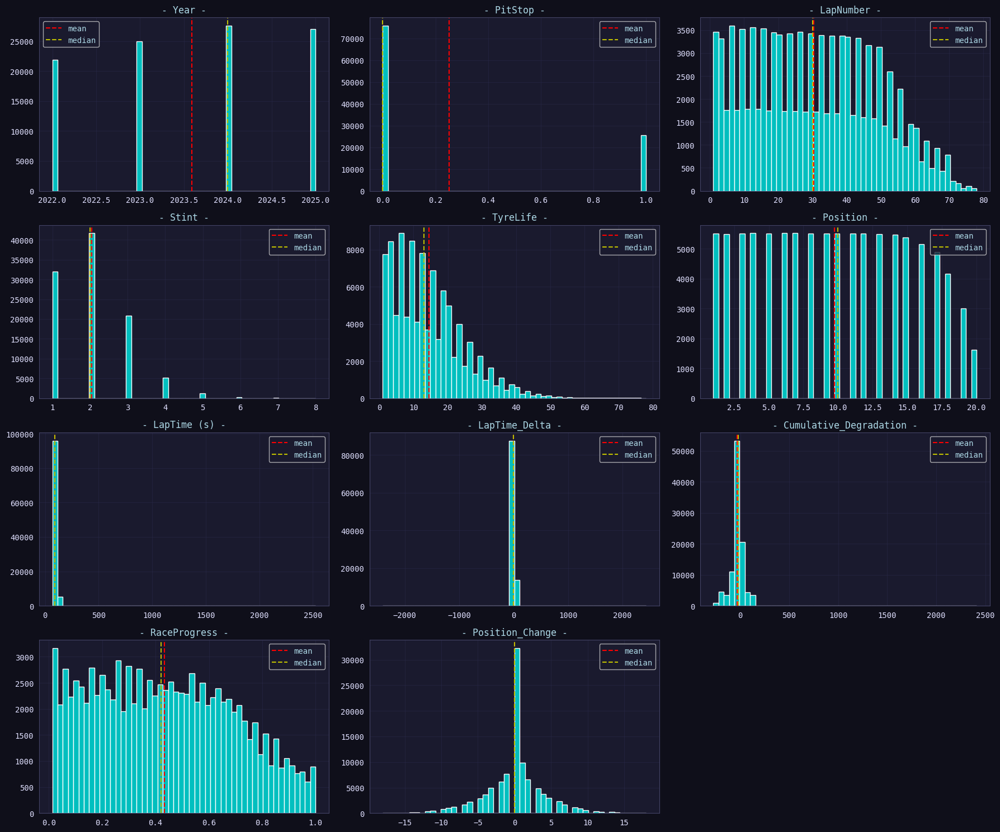

In [7]:
plt.figure(figsize=(18, 15))

for i, col in enumerate(NUMS):
    plt.subplot(4, 3, i+1)
    ax = plt.hist(orig[col], bins=50)
    plt.axvline(x=orig[col].mean(), color='r', linestyle='--', label='mean')
    plt.axvline(x=orig[col].median(), color='y', linestyle='--', label='median')
    plt.title(f'- {col} -')
    plt.legend()

plt.tight_layout()
plt.show()

In [8]:
## -- Unique value counts for each dataset --
TRAIN_UNIQUE = {}
ORIGINAL_UNIQUE = {}
TEST_UNIQUE = {}

for col in BASE:
    TRAIN_UNIQUE[col] = train[col].nunique()
    ORIGINAL_UNIQUE[col] = orig[col].nunique()
    TEST_UNIQUE[col] = test[col].nunique()

unique_counts_df = pd.concat(
        [pd.DataFrame(TRAIN_UNIQUE, index=['Train']),
         pd.DataFrame(ORIGINAL_UNIQUE, index=['Original']),
         pd.DataFrame(TEST_UNIQUE, index=['Test'])],
    )

unique_counts_df.style.background_gradient()

,Year,PitStop,LapNumber,Stint,TyreLife,Position,LapTime (s),LapTime_Delta,Cumulative_Degradation,RaceProgress,Position_Change,Driver,Compound,Race
Train,4,2,78,8,78,20,37719,57532,142701,1898,37,887,5,26
Original,4,2,78,8,78,20,40779,54084,81360,1437,37,31,5,28
Test,4,2,77,8,77,20,30286,40673,86823,1556,37,801,5,26


In [9]:
n_unique = train[BASE].nunique().sort_values()
n_unique

PitStop                        2
Year                           4
Compound                       5
Stint                          8
Position                      20
Race                          26
Position_Change               37
LapNumber                     78
TyreLife                      78
Driver                       887
RaceProgress                1898
LapTime (s)                37719
LapTime_Delta              57532
Cumulative_Degradation    142701
dtype: int64

## FEATURE ENGINEERING

In [10]:
## -- Digit extractions & binning --
ROUNDS = []
DIGITS = []
E_BINS = []
Q_BINS = []
DROP_COLS = []

round_thresh = 3
digit_thresh = 2

round_thresh, digit_thresh

(3, 2)

In [11]:
_extract_cols = ['Cumulative_Degradation', 'LapTime (s)'] # , 'LapTime_Delta'

print(f"\nRounding... ", end='')
for col in _extract_cols:
    for r in range(-2, 3):
        r_n = f"{col}_round_{r}"
        print(r_n+', ', end='')
        train[r_n] = train[col].round(r).astype('int32')
        test[r_n]  = test[col].round(r).astype('int32')
        orig[r_n]  = orig[col].round(r).astype('int32')

        ## -- Drop irrelevant features --
        if train[r_n].nunique() < round_thresh or train[r_n].nunique() == train[col].nunique():
            DROP_COLS.append(r_n)
        else:
            ROUNDS.append(r_n)

    # print(f"\nDIGITS... ", end='')
    # for d in [-3, -2, -1, 0, 1, 2, 3]:
    #     d_n = f'{col}_digit_{d}'
    #     print(d_n+', ', end='')
    #     train[d_n] = ((train[col] * 10**d) % 10).fillna(-1).astype('int8')
    #     test[d_n]  = ((test[col]  * 10**d) % 10).fillna(-1).astype('int8')
    #     orig[d_n]  = ((orig[col]  * 10**d) % 10).fillna(-1).astype('int8')

    #     ## -- Drop constant features --
    #     if train[d_n].nunique() < digit_thresh:
    #         DROP_COLS.append(d_n)
    #     else:
    #         DIGITS.append(d_n)

    # print(f"\nCreating value-based E_BINS... ", end='')
    # for b in [100]:
    #     b_n = f'{col}_bin_{b}'
    #     print(b_n+', ', end='')
    #     train[b_n], edges = pd.cut(train[col], bins=b, retbins=True, include_lowest=True, labels=False)
    #     test[b_n] = pd.cut(test[col], bins=edges, include_lowest=True, labels=False)
    #     orig[b_n] = pd.cut(orig[col], bins=edges, include_lowest=True, labels=False)
    #     E_BINS.append(b_n)

    # print(f"\nCreating quantile-based Q_BINS... ", end='')
    # for q in [100]:
    #     q_n = f'{col}_Qbin_{q}'
    #     print(q_n+', ', end='')
    #     train[q_n], edges = pd.qcut(train[col], q=q, retbins=True, duplicates='drop', labels=False)
    #     test[q_n] = pd.cut(test[col], bins=edges, include_lowest=True, labels=False)
    #     orig[q_n] = pd.cut(orig[col], bins=edges, include_lowest=True, labels=False)
    #     Q_BINS.append(q_n)

print()
print('='*50)
print(f'✅ Total ROUNDS: {len(ROUNDS)}')
print(f"✅ Total DIGITS: {len(DIGITS)}")
print(f"✅ Total E_BINS: {len(E_BINS)}")
print(f"✅ Total Q_BINS: {len(Q_BINS)}")


Rounding... Cumulative_Degradation_round_-2, Cumulative_Degradation_round_-1, Cumulative_Degradation_round_0, Cumulative_Degradation_round_1, Cumulative_Degradation_round_2, LapTime (s)_round_-2, LapTime (s)_round_-1, LapTime (s)_round_0, LapTime (s)_round_1, LapTime (s)_round_2, 
✅ Total ROUNDS: 10
✅ Total DIGITS: 0
✅ Total E_BINS: 0
✅ Total Q_BINS: 0


In [12]:
# _extract_cols = ['RaceProgress']

# for col in _extract_cols:
#     # print(f"\nRounding... ", end='')
#     # for r in [-2, -1, 0, 1, 2]:
#     #     r_n = f"{col}_round_{r}"
#     #     print(r_n+', ', end='')
#     #     train[r_n] = train[col].round(r).astype('int32')
#     #     test[r_n]  = test[col].round(r).astype('int32')
#     #     orig[r_n]  = orig[col].round(r).astype('int32')
#     #     ## -- Drop irrelevant features --
#     #     if train[r_n].nunique() < round_thresh or train[r_n].nunique() == train[col].nunique():
#     #         DROP_COLS.append(r_n)
#     #     else:
#     #         ROUNDS.append(r_n)

#     # print(f"\nDigits... ", end='')
#     # for d in [-1, 0]:
#     #     d_n = f'{col}_digit_{d}'
#     #     print(d_n+', ', end='')
#     #     train[d_n] = ((train[col] * 10**d) % 10).fillna(-1).astype('int8')
#     #     test[d_n]  = ((test[col]  * 10**d) % 10).fillna(-1).astype('int8')
#     #     orig[d_n]  = ((orig[col]  * 10**d) % 10).fillna(-1).astype('int8')

#     #     ## -- Drop constant features --
#     #     if train[d_n].nunique() < digit_thresh:
#     #         DROP_COLS.append(d_n)
#     #     else:
#     #         DIGITS.append(d_n)

#     # print(f"\nCreating value-based E_BINS... ", end='')
#     # for b in [10]:
#     #     b_n = f'{col}_bin_{b}'
#     #     print(b_n+', ', end='')
#     #     train[b_n], edges = pd.cut(train[col], bins=b, retbins=True, include_lowest=True, labels=False)
#     #     test[b_n] = pd.cut(test[col], bins=edges, include_lowest=True, labels=False)
#     #     orig[b_n] = pd.cut(orig[col], bins=edges, include_lowest=True, labels=False)
#     #     E_BINS.append(b_n)

#     print(f"\nCreating quantile-based Q_BINS... ", end='')
#     for q in [10]:
#         q_n = f'{col}_qbin_{q}'
#         print(q_n+', ', end='')
#         train[q_n], edges = pd.qcut(train[col], q=q, retbins=True, duplicates='drop', labels=False)
#         test[q_n] = pd.cut(test[col], bins=edges, include_lowest=True, labels=False)
#         orig[q_n] = pd.cut(orig[col], bins=edges, include_lowest=True, labels=False)
#         Q_BINS.append(q_n)

# print()
# print('='*50)
# print(f'✅ Total ROUNDS: {len(ROUNDS)}')
# print(f"✅ Total DIGITS: {len(DIGITS)}")
# print(f"✅ Total E_BINS: {len(E_BINS)}")
# print(f"✅ Total Q_BINS: {len(Q_BINS)}")

In [13]:
# _extract_cols = ['TyreLife']

# for col in _extract_cols:
#     # print(f"\nRounding... ", end='')
#     # for r in [-2, -1, 0, 1, 2]:
#     #     r_n = f"{col}_round_{r}"
#     #     print(r_n+', ', end='')
#     #     train[r_n] = train[col].round(r).astype('int32')
#     #     test[r_n]  = test[col].round(r).astype('int32')
#     #     orig[r_n]  = orig[col].round(r).astype('int32')
#     #     ## -- Drop irrelevant features --
#     #     if train[r_n].nunique() < round_thresh or train[r_n].nunique() == train[col].nunique():
#     #         DROP_COLS.append(r_n)
#     #     else:
#     #         ROUNDS.append(r_n)

#     # print(f"\nDigits... ", end='')
#     # for d in range(1, 7):
#     #     d_n = f'{col}_digit_{d}'
#     #     print(d_n+', ', end='')
#     #     train[d_n] = ((train[col] * 10**d) % 10).fillna(-1).astype('int8')
#     #     test[d_n]  = ((test[col]  * 10**d) % 10).fillna(-1).astype('int8')
#     #     orig[d_n]  = ((orig[col]  * 10**d) % 10).fillna(-1).astype('int8')

#     #     ## -- Drop constant features --
#     #     if train[d_n].nunique() < digit_thresh:
#     #         DROP_COLS.append(d_n)
#     #     else:
#     #         DIGITS.append(d_n)

#     print(f"\nCreating value-based E_BINS... ", end='')
#     for b in [[0, 3, 6, 10, 15, 20, 30, 40, np.inf]]:
#         b_n = f'{col}_bin_custom'
#         print(b_n+', ', end='')
#         train[b_n], edges = pd.cut(train[col], bins=b, retbins=True, include_lowest=True, labels=False)
#         test[b_n] = pd.cut(test[col], bins=edges, include_lowest=True, labels=False)
#         orig[b_n] = pd.cut(orig[col], bins=edges, include_lowest=True, labels=False)
#         E_BINS.append(b_n)

#     # print(f"\nCreating quantile-based Q_BINS... ", end='')
#     # for q in [5]:
#     #     q_n = f'{col}_Qbin_{q}'
#     #     print(q_n+', ', end='')
#     #     train[q_n], edges = pd.qcut(train[col], q=q, retbins=True, duplicates='drop', labels=False)
#     #     test[q_n] = pd.cut(test[col], bins=edges, include_lowest=True, labels=False)
#     #     orig[q_n] = pd.cut(orig[col], bins=edges, include_lowest=True, labels=False)
#     #     Q_BINS.append(q_n)

# print()
# print('='*50)
# print(f'✅ Total ROUNDS: {len(ROUNDS)}')
# print(f"✅ Total DIGITS: {len(DIGITS)}")
# print(f"✅ Total E_BINS: {len(E_BINS)}")
# print(f"✅ Total Q_BINS: {len(Q_BINS)}")

In [14]:
train = train.drop(columns=DROP_COLS)
test  = test.drop(columns=DROP_COLS)
orig  = orig.drop(columns=DROP_COLS)

print(f"Features dropped: {DROP_COLS}")

Features dropped: []


In [15]:
train[ROUNDS+DIGITS+E_BINS+Q_BINS].nunique()

Cumulative_Degradation_round_-2      7
Cumulative_Degradation_round_-1     51
Cumulative_Degradation_round_0     454
Cumulative_Degradation_round_1     447
Cumulative_Degradation_round_2     445
LapTime (s)_round_-2                 5
LapTime (s)_round_-1                25
LapTime (s)_round_0                137
LapTime (s)_round_1                134
LapTime (s)_round_2                132
dtype: int64

In [16]:
# def add_frequency_condition(df1, cols, thresh=5): 
#     df = df1.copy()
#     for c in cols:
#         v_counts = df[c].value_counts()
#         to_replace = v_counts[v_counts <= thresh].index
#         df[c] = np.where(df[c].isin(to_replace), -1, df[c])

#     return df

# train = add_frequency_condition(train, DIGITS+ROUNDS, thresh=5)
# test  = add_frequency_condition(test,  DIGITS+ROUNDS, thresh=5)
# orig  = add_frequency_condition(orig,  DIGITS+ROUNDS, thresh=5)

# print(f"Frequency threshold imputed!")

In [17]:
# INTER = []
# top_cols = ['Year','Compound','Stint','Race','PitStop'] # ,'TyreLife'
# low_cols = ['Position','Position_Change','LapNumber','Driver']

# for c1, c2 in tqdm(list(itertools.combinations(top_cols, 2)), desc='Pairwise'):
#     n_col = f"Bi_{c1}-|-{c2}"
#     train[n_col] = train[c1].astype(str) + '_' + train[c2].astype(str)
#     test[n_col]  = test[c1].astype(str) + '_' + test[c2].astype(str)
#     orig[n_col]  = orig[c1].astype(str) + '_' + orig[c2].astype(str)
#     INTER.append(n_col)

# # for c1, c2, c3 in tqdm(list(itertools.combinations(top_cols, 3)), desc='Triplewise'):
# #     n_col = f"Tri_{c1}-|-{c2}-|-{c3}"
# #     train[n_col] = train[c1].astype(str) + '_' + train[c2].astype(str) + '_' + train[c3].astype(str)
# #     test[n_col]  = test[c1].astype(str) + '_' + test[c2].astype(str) + '_' + test[c3].astype(str)
# #     orig[n_col]  = orig[c1].astype(str) + '_' + orig[c2].astype(str) + '_' + test[c3].astype(str)
# #     INTER.append(n_col)

# # for c1, c2 in tqdm(list(itertools.product(top_cols, low_cols)), desc='One-to-Many'):
# #     n_col = f"Bi_{c1}-|-{c2}"
# #     train[n_col] = train[c1].astype(str) + '_' + train[c2].astype(str)
# #     test[n_col]  = test[c1].astype(str) + '_' + test[c2].astype(str)
# #     orig[n_col]  = orig[c1].astype(str) + '_' + orig[c2].astype(str)
# #     INTER.append(n_col)

# print(f"Total Interaction Features: {len(INTER)}")

In [18]:
## -- Arithmetic interactions --
for df in [train, test, orig]:
    df['_LapNumber_div_RaceProgress'] = (df['LapNumber'] / (df['RaceProgress'] + 1e-6)).astype('float32')
    df['_TyreLife_div_LapNumber'] = (df['TyreLife'] / df['LapNumber'].clip(lower=1)).astype('float32')
    df['_LapTime_s_*_Cum_Degrad'] = (df['LapTime (s)'] * df['Cumulative_Degradation']).astype('float32')
    df['_LapTime_s_*_Cum_Degrad_abs'] = (df['LapTime (s)'] * df['Cumulative_Degradation'].abs()).astype('float32')
    df['_LapTime_s_div_Cum_Degrad_abs'] = (df['LapTime (s)'] / (df['Cumulative_Degradation'].abs() + 1e-6)).astype('float32')

arithmetic = [
    '_LapNumber_div_RaceProgress',
    '_TyreLife_div_LapNumber',
    '_LapTime_s_*_Cum_Degrad',
    '_LapTime_s_*_Cum_Degrad_abs',
    '_LapTime_s_div_Cum_Degrad_abs',
]

print(f"Total Arithmetic interactions: {len(arithmetic)}")

train[arithmetic].head()

Total Arithmetic interactions: 5


,_LapNumber_div_RaceProgress,_TyreLife_div_LapNumber,_LapTime_s_*_Cum_Degrad,_LapTime_s_*_Cum_Degrad_abs,_LapTime_s_div_Cum_Degrad_abs
0,69.999901,0.780000,1649.802368,1649.802368,3.734288
1,77.999771,0.259259,-16761.730469,16761.730469,0.336437
2,71.999908,0.372881,-7132.029785,7132.029785,0.705717
3,25.999662,1.000000,-691.099976,691.099976,12.883805
4,71.999802,0.230769,-1525.286987,1525.286987,7.629817


In [19]:
# ## -- Cyclic encoding --
# for df in [train, test, orig]:
#     for p in [12, 30]:
#         df[f"MonthlyCharges_sin_{p}"] = np.sin(2 * np.pi * df['MonthlyCharges'] / p).astype('float32')
#         df[f"MonthlyCharges_cos_{p}"] = np.cos(2 * np.pi * df['MonthlyCharges'] / p).astype('float32')

In [20]:
## -- Frequency encoding --
freq_cols = []

print(f"\nCreating frequencies... ", end='')
for col in CATS: #  + ['LapNumber', 'RaceProgress'] 'Position_Change'
    freq = pd.concat([train[col], orig[col], test[col]]).value_counts(normalize=True)
    n = f'{col}_freq'
    print(n+', ', end='')
    for df in [train, test, orig]:
        df[n] = df[col].map(freq).fillna(0).astype('float32')
    freq_cols.append(n)

print(f"\n✓ Total frequency features: {len(freq_cols)}")


Creating frequencies... Driver_freq, Compound_freq, Race_freq, 
✓ Total frequency features: 3


In [21]:
from sklearn.base import BaseEstimator, TransformerMixin ## ===== Target/Category Mean ENCODERS =====

class TargetEncoder(BaseEstimator, TransformerMixin):
    """
    Target Encoder that supports multiple aggregation functions,
    internal cross-validation for leakage prevention, and smoothing.

    Parameters
    ----------
    cols_to_encode : list of str
        List of column names to be target encoded.

    aggs : list of str, default=['mean']
        List of aggregation functions to apply. Any function accepted by
        pandas' `.agg()` method is supported, such as:
        'mean', 'std', 'var', 'min', 'max', 'skew', 'nunique', 
        'count', 'sum', 'median'.
        Smoothing is applied only to the 'mean' aggregation.

    cv : int, default=5
        Number of folds for cross-validation in fit_transform.

    smooth : float or 'auto', default='auto'
        The smoothing parameter `m`. A larger value puts more weight on the 
        global mean. If 'auto', an empirical Bayes estimate is used.
        
    drop_original : bool, default=False
        If True, the original columns to be encoded are dropped.
    """
    def __init__(self, cols_to_encode, aggs=['mean'], cv=5, smooth='auto', drop_original=False):
        self.cols_to_encode = cols_to_encode
        self.aggs = aggs
        self.cv = cv
        self.smooth = smooth
        self.drop_original = drop_original
        self.mappings_ = {}
        self.global_stats_ = {}

    def fit(self, X, y):
        """
        Learn mappings from the entire dataset.
        These mappings are used for the transform method on validation/test data.
        """
        temp_df = X.copy()
        temp_df['target'] = y

        # Learn global statistics for each aggregation
        for agg_func in self.aggs:
            self.global_stats_[agg_func] = y.agg(agg_func)

        # Learn category-specific mappings
        for col in self.cols_to_encode:
            self.mappings_[col] = {}
            for agg_func in self.aggs:
                mapping = temp_df.groupby(col)['target'].agg(agg_func)
                self.mappings_[col][agg_func] = mapping
        
        return self

    def transform(self, X):
        """
        Apply learned mappings to the data.
        Unseen categories are filled with global statistics.
        """
        X_transformed = X.copy()
        for col in self.cols_to_encode:
            for agg_func in self.aggs:
                new_col_name = f'TE_{col}_{agg_func}'
                map_series = self.mappings_[col][agg_func]
                X_transformed[new_col_name] = X[col].map(map_series)
                X_transformed[new_col_name].fillna(self.global_stats_[agg_func], inplace=True)
        
        if self.drop_original:
            X_transformed.drop(columns=self.cols_to_encode, inplace=True)
            
        return X_transformed

    def fit_transform(self, X, y):
        """
        Fit and transform the data using internal cross-validation to prevent leakage.
        """
        # First, fit on the entire dataset to get global mappings for transform method
        self.fit(X, y)

        # Initialize an empty DataFrame to store encoded features
        encoded_features = pd.DataFrame(index=X.index)
        
        kf = KFold(n_splits=self.cv, shuffle=True, random_state=42)

        for train_idx, val_idx in kf.split(X, y):
            X_train, y_train = X.iloc[train_idx], y.iloc[train_idx]
            X_val = X.iloc[val_idx]
            
            temp_df_train = X_train.copy()
            temp_df_train['target'] = y_train

            for col in self.cols_to_encode:
                # --- Calculate mappings only on the training part of the fold ---
                for agg_func in self.aggs:
                    new_col_name = f'TE_{col}_{agg_func}'
                    
                    # Calculate global stat for this fold
                    fold_global_stat = y_train.agg(agg_func)
                    
                    # Calculate category stats for this fold
                    mapping = temp_df_train.groupby(col)['target'].agg(agg_func)

                    # --- Apply smoothing only for 'mean' aggregation ---
                    if agg_func == 'mean':
                        counts = temp_df_train.groupby(col)['target'].count()
                        
                        m = self.smooth
                        if self.smooth == 'auto':
                            # Empirical Bayes smoothing
                            variance_between = mapping.var()
                            avg_variance_within = temp_df_train.groupby(col)['target'].var().mean()
                            if variance_between > 0:
                                m = avg_variance_within / variance_between
                            else:
                                m = 0  # No smoothing if no variance between groups
                        
                        # Apply smoothing formula
                        smoothed_mapping = (counts * mapping + m * fold_global_stat) / (counts + m)
                        encoded_values = X_val[col].map(smoothed_mapping)
                    else:
                        encoded_values = X_val[col].map(mapping)
                    
                    # Store encoded values for the validation fold
                    encoded_features.loc[X_val.index, new_col_name] = encoded_values.fillna(fold_global_stat)

        # Merge with original DataFrame
        X_transformed = X.copy()
        for col in encoded_features.columns:
            X_transformed[col] = encoded_features[col]
            
        if self.drop_original:
            X_transformed.drop(columns=self.cols_to_encode, inplace=True)
            
        return X_transformed


class CategoryMeanTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, cat_cols=None):
        self.cat_cols = cat_cols
        self.mappings_ = {}
    def fit(self, X, y):
        X = X.copy()
        if self.cat_cols is None:
            self.cat_cols = X.select_dtypes(include=['category']).columns.tolist()
        self.mappings_ = {}
        for col in self.cat_cols:
            df_temp = pd.DataFrame({col: X[col], 'y': y})
            group_means = df_temp.groupby(col, dropna=False)['y'].mean()
            sorted_categories = group_means.sort_values().index
            self.mappings_[col] = {cat: i for i, cat in enumerate(sorted_categories)}
        return self

    def transform(self, X, y=None):
        X = X.copy()
        for col, mapping in self.mappings_.items():
            if col in X.columns:
                X[col] = X[col].map(mapping)
        return X

In [22]:
def orig_TE_data_propagate(
    orig: pd.DataFrame,
    X_train: pd.DataFrame,
    X_valid: pd.DataFrame,
    X_test: pd.DataFrame,
    features: list=None,
    target: str=None,
    aggs: list=None,
    fill_nan: bool=False,
    ):

    if features is None or len(features) == 0:
        return X_train.copy(), X_valid.copy(), X_test.copy(), []

    if aggs is None or len(aggs) == 0:
        return X_train.copy(), X_valid.copy(), X_test.copy(), []

    X_train_df = X_train.copy()
    X_val_df   = X_valid.copy()
    X_test_df  = X_test.copy()
    ORIG = []

    maps = {}

    valid_features = [col for col in features if col in orig.columns]

    for col in tqdm(valid_features, desc='TE_merging'):
        for agg_ in aggs:
            agg_key = agg_.lower()
            new_col = f"OTE_{col}_{agg_key}"

            map_key = (col, agg_key)
            if map_key not in maps:
                try:
                    if agg_key == 'mean':
                        map_df = (orig.groupby(col)[target].mean().reset_index(name=new_col))
                    elif agg_key == 'median':
                        map_df = (orig.groupby(col)[target].median().reset_index(name=new_col))
                    elif agg_key == 'count':
                        map_df = (orig.groupby(col).size().reset_index(name=new_col))
                    elif agg_key == 'nunique':
                        map_df = (orig.groupby(col)[target].nunique().reset_index(name=new_col))
                    elif agg_key == 'std':
                        map_df = (orig.groupby(col)[target].std().reset_index(name=new_col))
                    elif agg_key == 'skew':
                        map_df = (orig.groupby(col)[target].skew().reset_index(name=new_col))
                    elif agg_key == 'max':
                        map_df = (orig.groupby(col)[target].max().reset_index(name=new_col))
                    elif agg_key == 'min':
                        map_df = (orig.groupby(col)[target].min().reset_index(name=new_col))
                    else:
                        continue
                except Exception as e:
                    print(f"Warning: failed to create map for col={col}, agg={agg_}: {e}")
                    continue

                maps[map_key] = map_df

            map_df = maps.get(map_key)
            if map_df is None:
                continue

            # Merge maps into each split
            X_train_df = X_train_df.merge(map_df, on=col, how='left')
            X_val_df   = X_val_df.merge(map_df, on=col, how='left')
            X_test_df  = X_test_df.merge(map_df, on=col, how='left')

            ORIG.append(new_col)

    global_mean   = orig[target].mean()
    global_median = orig[target].median()

    def fill_conditionally(df):
        for c in ORIG:
            if '_mean' in c or '_max' in c or '_min' in c:
                df[c] = df[c].fillna(global_mean)
            elif '_median' in c:
                df[c] = df[c].fillna(global_median)
            else:
                df[c] = df[c].fillna(0)
        return df

    if fill_nan:
        X_train_df = fill_conditionally(X_train_df)
        X_val_df   = fill_conditionally(X_val_df)
        X_test_df  = fill_conditionally(X_test_df)

    return X_train_df, X_val_df, X_test_df, ORIG

In [23]:
# train, test, _, ORIG_COLS = orig_TE_data_propagate(
#     orig,
#     train,
#     test,
#     train.iloc[:500],
#     features=BASE+DIGITS, #+DIGITS, #+ROUNDS,
#     target=TARGET,
#     aggs=['mean', 'std'], # mean, median, count, std, skew, nunique, max, min
#     # fill_nan=True,
# )

In [24]:
# ## -- Duplicate all numerics as categories --
# CATS_2    = []
# _num_cats = ['Cumulative_Degradation', 'LapTime (s)', 'LapTime_Delta']

# for c in _num_cats:
#     n = f"cat_{c}"
#     train[n] = train[c].copy()
#     test[n]  = test[c].copy()
#     orig[n]  = orig[c].copy()
#     CATS_2.append(n)

#     ## -- FACTORIZE CATS_2 --
#     combine  = pd.concat([train[n], test[n], orig[n]])
#     v = combine.factorize()[0]
#     train[n] = v[:len(train)].astype('int32')
#     test[n]  = v[len(train):len(train)+len(test)].astype('int32')
#     orig[n]  = v[len(train)+len(test):].astype('int32')

# print(f'Nums to Cats: {len(CATS_2)}')

In [25]:
# ## -- Factorize using combined data --
# for c in CATS:
#     combine  = pd.concat([train[c], test[c], orig[c]])
#     combine  = combine.factorize()[0]
#     # combine  = pd.Series(combine).astype('category')
#     train[c] = combine[:len(train)]
#     test[c]  = combine[len(train):len(train)+len(test)]
#     orig[c]  = combine[-len(orig):]

# print('Label encoding complete!')

In [26]:
## -- Flag 'Year' == 2023 --
for df in [train, test, orig]:
    df['is_2023'] = (df['Year'] == 2023).astype('int8')

print('Flag Year:', 'is_2023')

Flag Year: is_2023


In [27]:
FEATURES = [c for c in train.columns if c not in ['id', TARGET]]
print('Total Features:', len(FEATURES))

train.head() 

Total Features: 33


,Driver,Compound,Race,Year,PitStop,LapNumber,Stint,TyreLife,Position,LapTime (s),LapTime_Delta,Cumulative_Degradation,RaceProgress,Position_Change,PitNextLap,Cumulative_Degradation_round_-2,Cumulative_Degradation_round_-1,Cumulative_Degradation_round_0,Cumulative_Degradation_round_1,Cumulative_Degradation_round_2,LapTime (s)_round_-2,LapTime (s)_round_-1,LapTime (s)_round_0,LapTime (s)_round_1,LapTime (s)_round_2,_LapNumber_div_RaceProgress,_TyreLife_div_LapNumber,_LapTime_s_*_Cum_Degrad,_LapTime_s_*_Cum_Degrad_abs,_LapTime_s_div_Cum_Degrad_abs,Driver_freq,Compound_freq,Race_freq,is_2023
0,D109,HARD,Canadian Grand Prix,2022,0,50,2,39.0,8,78.491,-7.564,21.019,0.714286,5.0,1.0,0,20,21,21,21,100,80,78,78,78,69.999901,0.780000,1649.802368,1649.802368,3.734288,0.002034,0.395496,0.048945,0
1,D086,HARD,Dutch Grand Prix,2025,1,27,2,7.0,4,75.095,-32.617,-223.207,0.346154,-3.0,0.0,-200,-220,-223,-223,-223,100,80,75,75,75,77.999771,0.259259,-16761.730469,16761.730469,0.336437,0.002207,0.395496,0.055289,0
2,ZON,HARD,Austrian Grand Prix,2022,0,59,3,22.0,13,70.945,-7.540,-100.529,0.819444,3.0,1.0,-100,-100,-101,-100,-100,100,70,71,70,70,71.999908,0.372881,-7132.029785,7132.029785,0.705717,0.002893,0.395496,0.047861,0
3,SPE,MEDIUM,Pre-Season Testing,2023,0,2,1,2.0,7,94.361,-7.324,-7.324,0.076923,0.0,0.0,0,-10,-7,-7,-7,100,90,94,94,94,25.999662,1.000000,-691.099976,691.099976,12.883805,0.002857,0.466199,0.048732,1
4,D019,HARD,Azerbaijan Grand Prix,2022,1,26,3,6.0,2,107.878,8.965,-14.139,0.361111,3.0,0.0,0,-10,-14,-14,-14,100,110,108,107,107,71.999802,0.230769,-1525.286987,1525.286987,7.629817,0.002793,0.395496,0.028870,0


# ML TRAINING

In [28]:
try:
    import h2o
except:
    %pip install -q -U h2o
    import h2o
    
from h2o import H2OFrame
from h2o.automl import H2OAutoML

print('h2o version:', h2o.__version__)

h2o version: 3.46.0.10


In [29]:
def Trainer_CV(model_name, params, train_df, test_df, features, target, kf, cats):
    print(f"\n========= Starting Cross-Validation for {model_name} ==========")
    start = time()

    X = train_df[features]
    y = train_df[target].astype('int8')
    
    f_glm_preds = np.zeros(len(X))
    f_gbm_preds = np.zeros(len(X))
    f_drf_preds = np.zeros(len(X))
    f_xgb_preds = np.zeros(len(X))
    f_dpl_preds = np.zeros(len(X))

    t_glm_preds = np.zeros(len(test_df))
    t_gbm_preds = np.zeros(len(test_df))
    t_drf_preds = np.zeros(len(test_df))
    t_xgb_preds = np.zeros(len(test_df))
    t_dpl_preds = np.zeros(len(test_df))

    h2o_models  = {
        'glm': [f_glm_preds, t_glm_preds],
        'gbm': [f_gbm_preds, t_gbm_preds],
        'drf': [f_drf_preds, t_drf_preds],
        'xgboost': [f_xgb_preds, t_xgb_preds],
        'deeplearning': [f_dpl_preds, t_dpl_preds],
    }

    oof_preds = np.zeros(len(X))
    test_preds = np.zeros(len(test_df))
    fold_scores = []

    for idx, (train_idx, val_idx) in enumerate(kf.split(X, y)):
        print(f"\n***** FOLD {idx + 1}/{kf.n_splits} - ", end='')

        # Split data for the current fold
        X_train, X_valid = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_valid = y.iloc[train_idx], y.iloc[val_idx]

        X_test = test_df[features].copy()

        # ## -- OPTION A: CONCATENATE ORIGINAL DATA --
        # X_train = pd.concat([X_train, orig[features]], ignore_index=True)
        # y_train = pd.concat([y_train, orig[target]], ignore_index=True)
        # y_train = np.concatenate([y_train, orig[TARGET].values], axis=0)

        # cme_cats = NUMS 
        # cme_cols = []
        # print(f"CategoryMeanEncoding: {len(cme_cats)} | ", end='')
        # for c in cme_cats:
        #     n = f"CME_{c}"
        #     CME = CategoryMeanTransformer(cat_cols=[c])
        #     X_train[n] = CME.fit_transform(X_train[[c]], y_train).fillna(-1).astype('int32')
        #     X_valid[n]   = CME.transform(X_valid[[c]]).fillna(-1).astype('int32')
        #     X_test[n]  = CME.transform(X_test[[c]]).fillna(-1).astype('int32')
        #     cme_cols.append(n)

        # ## -- TE Opt1. -> Using CUSTOM -- +ROUNDS
        # te_enc1 = TargetEncoder(INTER, cv=5, smooth='auto', aggs=['mean'], drop_original=True)
        # X_train = te_enc1.fit_transform(X_train, y_train)
        # X_valid = te_enc1.transform(X_valid)
        # X_test  = te_enc1.transform(X_test)

        # ## -- TE Opt1. -> Using CUSTOM --
        # te_enc = TargetEncoder(['Driver'], cv=5, smooth='auto', aggs=['mean'], drop_original=True)
        # X_train = te_enc.fit_transform(X_train, y_train)
        # X_valid = te_enc.transform(X_valid)
        # X_test  = te_enc.transform(X_test)

        # cm_enc = CategoryMeanTransformer(cat_cols=['Race', 'Driver', 'Compound'])
        # X_train = cm_enc.fit_transform(X_train, y_train)
        # X_valid = cm_enc.transform(X_valid)
        # X_test  = cm_enc.transform(X_test)

        combined = pd.concat([X_train, X_valid, X_test])
        for c in cats:
            combined[c] = combined[c].astype(str).astype('category')

        X_train = combined.iloc[:len(X_train)]
        X_valid = combined.iloc[len(X_train):len(X_train)+len(X_valid)]
        X_test  = combined.iloc[len(X_train)+len(X_valid):]

        print(f"Train shape: {X_train.shape} -")

        h2o.init(verbose=False, max_mem_size=20) # max_mem_size = in gigabyte

        model = H2OAutoML(**params)
        model.train(
            training_frame = H2OFrame(pd.concat([X_train, y_train.astype(bool)], axis=1)),
            # validation_frame = H2OFrame(pd.concat([X_valid, y_valid.astype(bool)], axis=1)),
            y=target,
        )

        ## -- Predict on validation and test sets -- 
        oof_preds[val_idx] = model.leader.predict(H2OFrame(X_valid))\
                                  .as_data_frame(use_multi_thread=True).iloc[:, -1].to_numpy()
        test_preds += model.leader.predict(H2OFrame(X_test))\
                                  .as_data_frame(use_multi_thread=True).iloc[:, -1].to_numpy()
        
        ## ==========================================
    
        for i, (k, v) in enumerate(h2o_models.items()):
            print(f" • Predicting... {k}")
            v[0][val_idx] = model.get_best_model(algorithm=k).predict(H2OFrame(X_valid))\
                         .as_data_frame(use_multi_thread=True).iloc[:, -1].to_numpy()

            v[1] += model.get_best_model(algorithm=k).predict(H2OFrame(X_test))\
                         .as_data_frame(use_multi_thread=True).iloc[:, -1].to_numpy()
            v[1] /= kf.n_splits
        ## ==========================================

        ## -- Calculate fold score --
        fold_auc = roc_auc_score(y_valid, oof_preds[val_idx])
        fold_scores.append(fold_auc)
        print(f'{CFG.YELLOW} • Fold {idx+1} AUC: {fold_auc:.5f}{CFG.RESET}')

        ## -- Clean up memory --
        del X_train, y_train, X_test
        gc.collect() 

    ## -- Average the test predictions
    test_preds /= kf.n_splits
    
    ## -- Print cv results
    print("\n==================================================")
    print(f"Cross-Validation Results for {model_name}")
    print("==================================================")
    for i, score in enumerate(fold_scores):
        print(f" • Fold {i+1} score: {score:.5f}")
    
    ## -- Final out-of-fold AUC
    oof_auc = np.round(roc_auc_score(y, oof_preds), 5)
    print("-------------------------------------------------|")
    print(f"Overall AUC: {oof_auc}")
    print(f"Average AUC: {np.mean(fold_scores):.5f} ± {np.std(fold_scores):.5f}")
    print("-------------------------------------------------|")
    print(f'{((time() - start) / 60):.2f} mins')

    return {
        'oof_preds': oof_preds,
        'test_preds': test_preds,
        'h2o': h2o_models,
        'score': oof_auc,
        'model': model,
        'val_data': H2OFrame(pd.concat([X_valid, y_valid.astype(bool)], axis=1)), 
    }

print('⚙️⚙️ Training Function Ready ⚙️⚙️')

⚙️⚙️ Training Function Ready ⚙️⚙️


In [30]:
version_name = 'h2o_cv1_'
all_model_predictions = {}

MULTI_SEEDS  = [CFG.SEED, 777, 1234, 24611, 0]

N_SPLITS = 5
kf = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=CFG.SEED)

kf

StratifiedKFold(n_splits=5, random_state=42, shuffle=True)

In [31]:
x_sample, x_sample2 = train_test_split(train, train_size=0.1, stratify=train[TARGET], random_state=0)
x_sample.head(3)

,Driver,Compound,Race,Year,PitStop,LapNumber,Stint,TyreLife,Position,LapTime (s),LapTime_Delta,Cumulative_Degradation,RaceProgress,Position_Change,PitNextLap,Cumulative_Degradation_round_-2,Cumulative_Degradation_round_-1,Cumulative_Degradation_round_0,Cumulative_Degradation_round_1,Cumulative_Degradation_round_2,LapTime (s)_round_-2,LapTime (s)_round_-1,LapTime (s)_round_0,LapTime (s)_round_1,LapTime (s)_round_2,_LapNumber_div_RaceProgress,_TyreLife_div_LapNumber,_LapTime_s_*_Cum_Degrad,_LapTime_s_*_Cum_Degrad_abs,_LapTime_s_div_Cum_Degrad_abs,Driver_freq,Compound_freq,Race_freq,is_2023
419137,SHA,HARD,Canadian Grand Prix,2025,0,63,3,15.0,4,76.620,-1.588,-30.898,0.807692,1.0,1.0,0,-30,-31,-30,-30,100,80,77,76,76,77.999901,0.238095,-2367.404785,2367.404785,2.479772,0.002812,0.395496,0.048945,0
417793,BUT,HARD,Azerbaijan Grand Prix,2024,0,18,1,18.0,4,109.876,32.438,-13.184,0.233766,4.0,0.0,0,-10,-13,-13,-13,100,110,110,109,109,76.999672,1.000000,-1448.605225,1448.605225,8.334041,0.003273,0.395496,0.028870,0
364746,SHA,HARD,Canadian Grand Prix,2022,0,25,2,20.0,14,79.161,-16.523,-58.351,0.347222,-8.0,1.0,-100,-60,-58,-58,-58,100,80,79,79,79,71.999794,0.800000,-4619.123535,4619.123535,1.356635,0.002812,0.395496,0.048945,0


In [32]:
!rm -r /kaggle/working/

rm: cannot remove '/kaggle/working/': Device or resource busy


In [33]:
USE_FULL_TRAIN = True
train_data = train.copy() if USE_FULL_TRAIN else x_sample.reset_index(drop=True).copy()

if all_model_predictions:
    all_model_predictions.clear()

num_models = 50

PARAMS = {
    'max_models': num_models,
    'max_runtime_secs': 8000,
    'nfolds': 4, # def=-1, 0 if validation_frame is provided
    'seed': CFG.SEED,
    'stopping_rounds': 5,
    # 'stopping_metric': 'AUC',
    # 'preprocessing': ['target_encoding'],
}

n = version_name
# for seed_ in MULTI_SEEDS: #
#     PARAMS['seed'] = seed_
#     n = version_name + str(seed_)
all_model_predictions[n] = Trainer_CV(
    model_name=n,
    params=PARAMS,
    train_df=train_data,
    test_df=test,
    features=FEATURES,
    target=TARGET,
    kf=kf,
    cats=['Compound','Race','Stint','Year','PitStop','Driver'], # , ,'is_2023'
)


========= Starting Cross-Validation for h2o_cv1_ ==========

***** FOLD 1/5 - Train shape: (351312, 33) -
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
xgboost prediction progress: |███████████████████████████████████████████████████| (done) 100%
Export File progress: |██████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
xgboost prediction progress: |███████████████████████████████████████████████████| (done) 100%
Export File progress: |██████████████████████████████████████████████████████████| (done) 100%
 • Predicting... glm
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
glm prediction pr

In [34]:
# ROUNDS(no TE) | freq(only CATS) | is_2023 |
# ----------------------------------------------------------------------------------
# Cross-Validation Results for h2o_v1_((105394, 33))
# ==================================================
#  • Fold 1 score: 0.94728
#  • Fold 2 score: 0.94681
#  • Fold 3 score: 0.94646
#  • Fold 4 score: 0.94739
#  • Fold 5 score: 0.94677
# -------------------------------------------------|
# Overall AUC: 0.94693
# Average AUC: 0.94694 ± 0.00035
# -------------------------------------------------|
# 53.65 mins
# Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%

{'h2o_cv1_': np.float64(0.94774)}


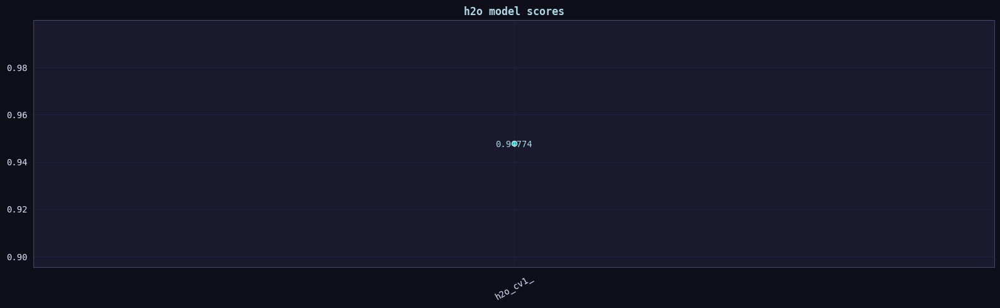

In [35]:
## -- Get Scores --
all_model_scores = {}
all_scores = []

for k, v in all_model_predictions.items():
    for x, y in v.items():
        if x == 'score':
            all_model_scores[k] = y
            all_scores.append(float(y))

print(all_model_scores)

plt.figure(figsize=(16, 5))
sns.lineplot(all_model_scores, marker='o')
plt.title('h2o model scores', fontweight='semibold')
plt.tick_params('x', rotation=30)

for i, s in enumerate(all_model_scores.values()):
    plt.text(float(i), s+1e-4, s, ha='center', va='center_baseline')

plt.tight_layout()
plt.show()

glm oof & test files saved!


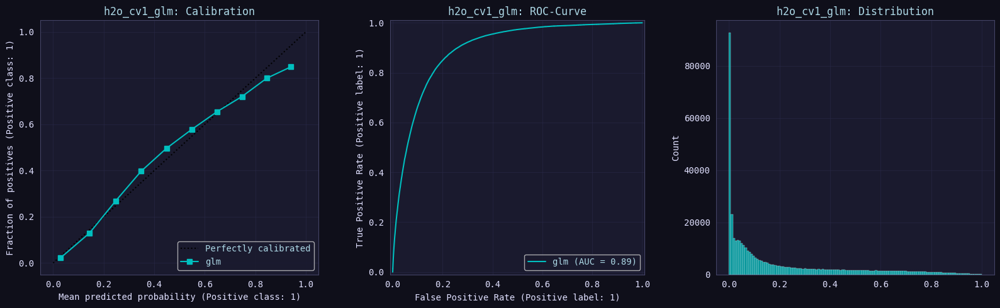


gbm oof & test files saved!


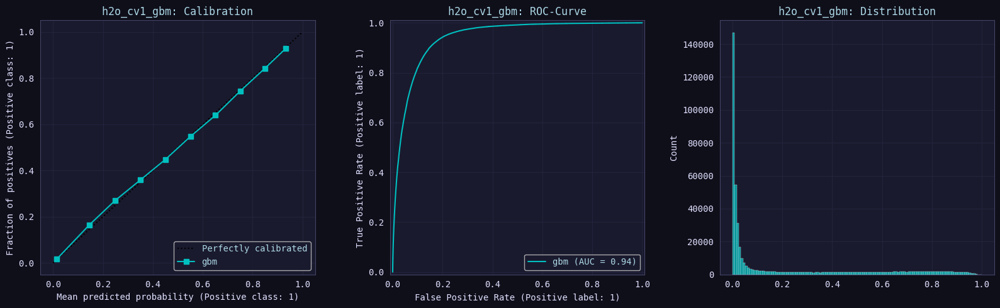


drf oof & test files saved!


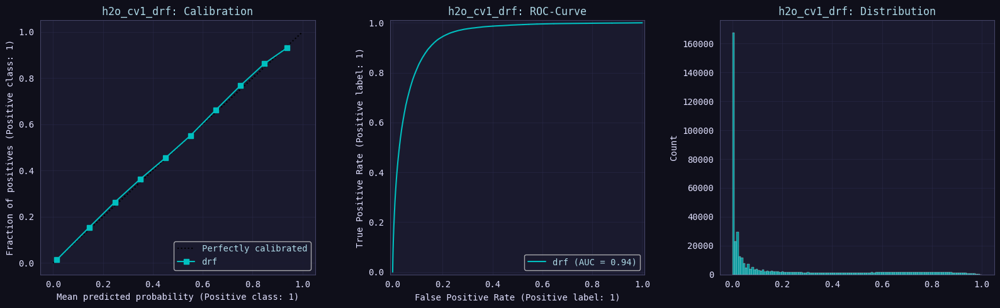


xgboost oof & test files saved!


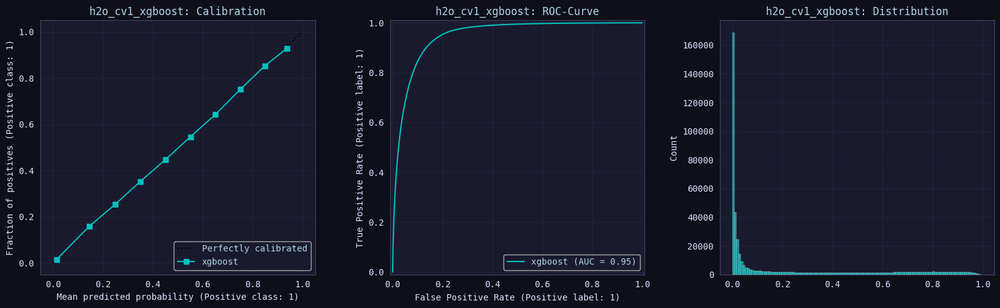


deeplearning oof & test files saved!


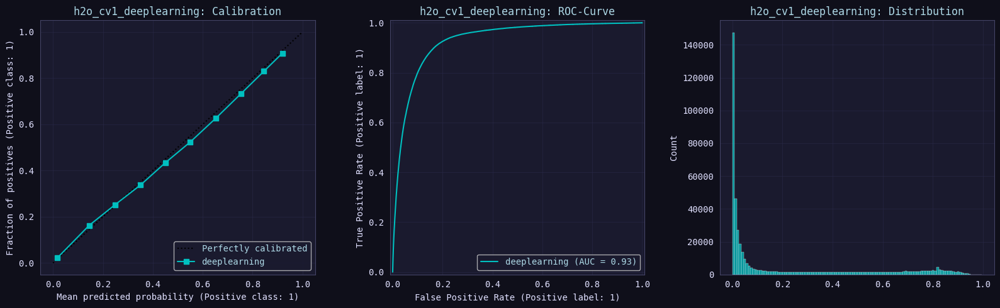

In [36]:
## -- Get oof: Best of each algorithm group base models predictions --

for i, (k, v) in enumerate(all_model_predictions.items()):
    for x, y in v.items():
        if x == 'h2o':
            for a, b in y.items():
                ## -- Save oof predictions --
                np.save(f"oof_{version_name}{a}.npy", b[0])
                np.save(f"test_{version_name}{a}.npy", b[1])
                print(f'{a} oof & test files saved!')

                ## -- Plot oof distributions --
                _, axs = plt.subplots(1, 3, figsize=(16, 5)) 
                CalibrationDisplay.from_predictions(train_data[TARGET], b[0], n_bins=10, name=a, ax=axs[0])
                axs[0].set_title(f"{version_name}{a}: Calibration")
    
                RocCurveDisplay.from_predictions(train_data[TARGET], b[0], name=a, ax=axs[1])
                axs[1].set_title(f"{version_name}{a}: ROC-Curve")
    
                sns.histplot(b[0], ax=axs[2])
                axs[2].set_title(f"{version_name}{a}: Distribution")
                
                plt.tight_layout()
                plt.show()
                print()

h2o_cv1__94774 saved!


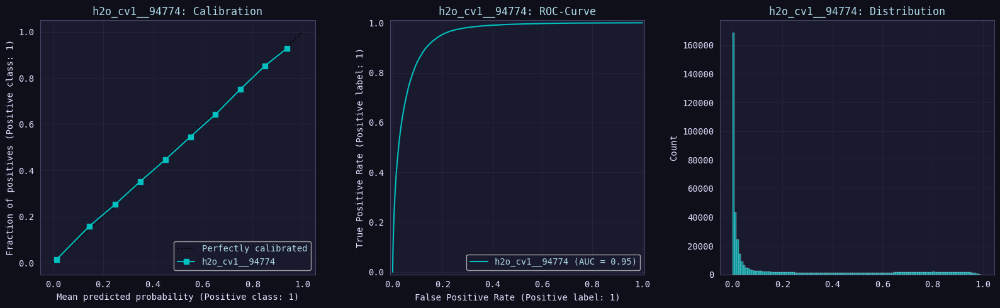

In [37]:
## -- Get oof predictions --

for i, (k, v) in enumerate(all_model_predictions.items()):
    for x, y in v.items():
        if x == 'oof_preds':
            ## -- Save oof predictions --
            n = f"{k}_{str(all_scores[i]).split('.')[1]}"
            np.save(f"oof_{n}.npy", y)
            print(f'{n} saved!')

            ## -- Plot oof distributions --
            _, axs = plt.subplots(1, 3, figsize=(16, 5)) 
            CalibrationDisplay.from_predictions(train_data[TARGET], y, n_bins=10, name=n, ax=axs[0])
            axs[0].set_title(f"{n}: Calibration")

            RocCurveDisplay.from_predictions(train_data[TARGET], y, name=n, ax=axs[1])
            axs[1].set_title(f"{n}: ROC-Curve")

            sns.histplot(y, ax=axs[2])
            axs[2].set_title(f"{n}: Distribution")
            
            plt.tight_layout()
            plt.show()

            print()

h2o_cv1__94774 saved! (188165,)


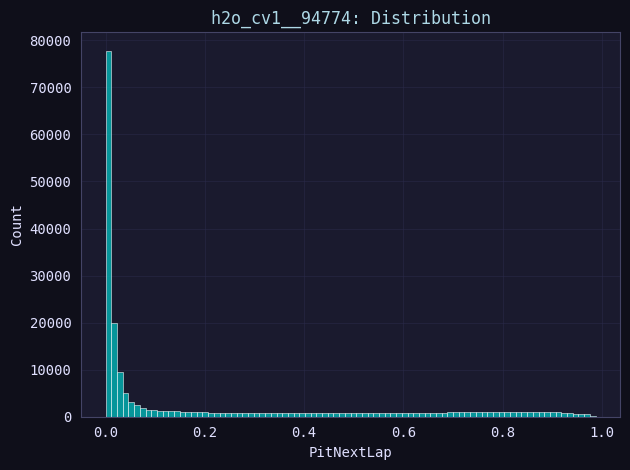

,id,PitNextLap
0,439140,0.002222
1,439141,0.004798
2,439142,0.001868
3,439143,0.246045
4,439144,0.774127
5,439145,0.271306
6,439146,0.000581
7,439147,0.002759
8,439148,0.017047
9,439149,0.002097


In [38]:
## -- Save test predictions/submissions --
for i, (k, v) in enumerate(all_model_predictions.items()):
    for j, (x, y) in enumerate(v.items()):
        if x == 'test_preds':
            n = f"{k}_{str(all_scores[i]).split('.')[1]}"
            np.save(f"test_{n}.npy", y)

            submit[TARGET] = y
            submit.to_csv(f'submit_{n}.csv', index=False)
            print(f'{n} saved! {y.shape}')

sns.histplot(submit[TARGET])
plt.title(f"{n}: Distribution")
plt.tight_layout()
plt.show()
    
submit.head(10)

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse,training_time_ms,predict_time_per_row_ms,algo
XGBoost_grid_1_AutoML_5_20260524_222706_model_5,0.948472,0.226694,0.808797,0.132412,0.266151,0.0708364,90451,0.00519,XGBoost
XGBoost_2_AutoML_5_20260524_222706,0.948215,0.227488,0.807473,0.126369,0.267095,0.0713397,81380,0.005046,XGBoost
XGBoost_grid_1_AutoML_5_20260524_222706_model_3,0.948078,0.228053,0.805758,0.130156,0.266991,0.0712844,112794,0.005492,XGBoost
XGBoost_grid_1_AutoML_5_20260524_222706_model_2,0.948034,0.227777,0.806729,0.133706,0.267134,0.0713606,161309,0.005086,XGBoost
XGBoost_3_AutoML_5_20260524_222706,0.948022,0.227609,0.809341,0.130416,0.266844,0.0712056,124011,0.006036,XGBoost
XGBoost_1_AutoML_5_20260524_222706,0.94729,0.230644,0.802329,0.132463,0.268948,0.0723332,94257,0.005717,XGBoost
XGBoost_grid_1_AutoML_5_20260524_222706_model_1,0.946694,0.231482,0.801714,0.134461,0.268901,0.0723078,147585,0.005692,XGBoost
XGBoost_grid_1_AutoML_5_20260524_222706_model_4,0.946388,0.231228,0.804983,0.137829,0.268892,0.0723028,203771,0.007479,XGBoost
DRF_1_AutoML_5_20260524_222706,0.942162,0.242071,0.78914,0.139656,0.273334,0.0747114,53505,0.019227,DRF
XRT_1_AutoML_5_20260524_222706,0.941511,0.245029,0.789132,0.140718,0.276095,0.0762286,70527,0.021066,DRF


# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## XGBoost_3_AutoML_5_20260524_222706

,False,True,Error,Rate
False,63934.0,6418.0,0.0912,(6418.0/70352.0)
True,2964.0,14512.0,0.1696,(2964.0/17476.0)
Total,66898.0,20930.0,0.1068,(9382.0/87828.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

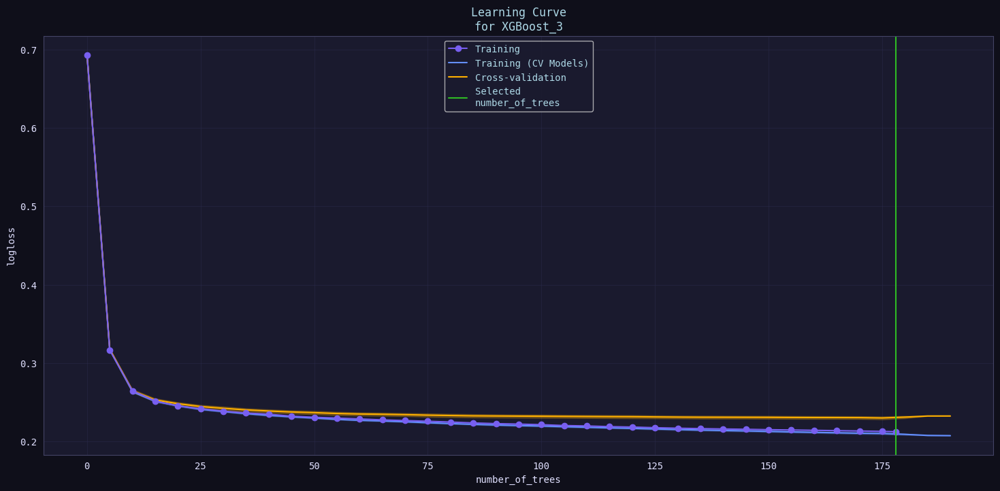

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

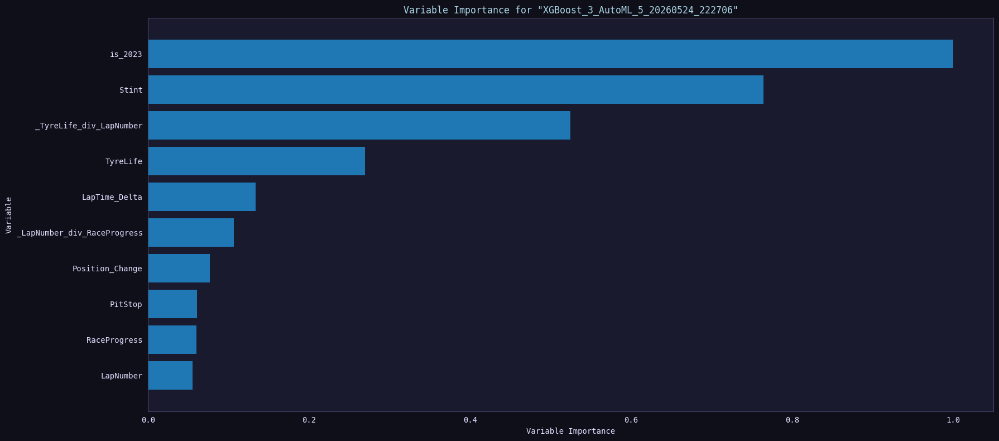

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

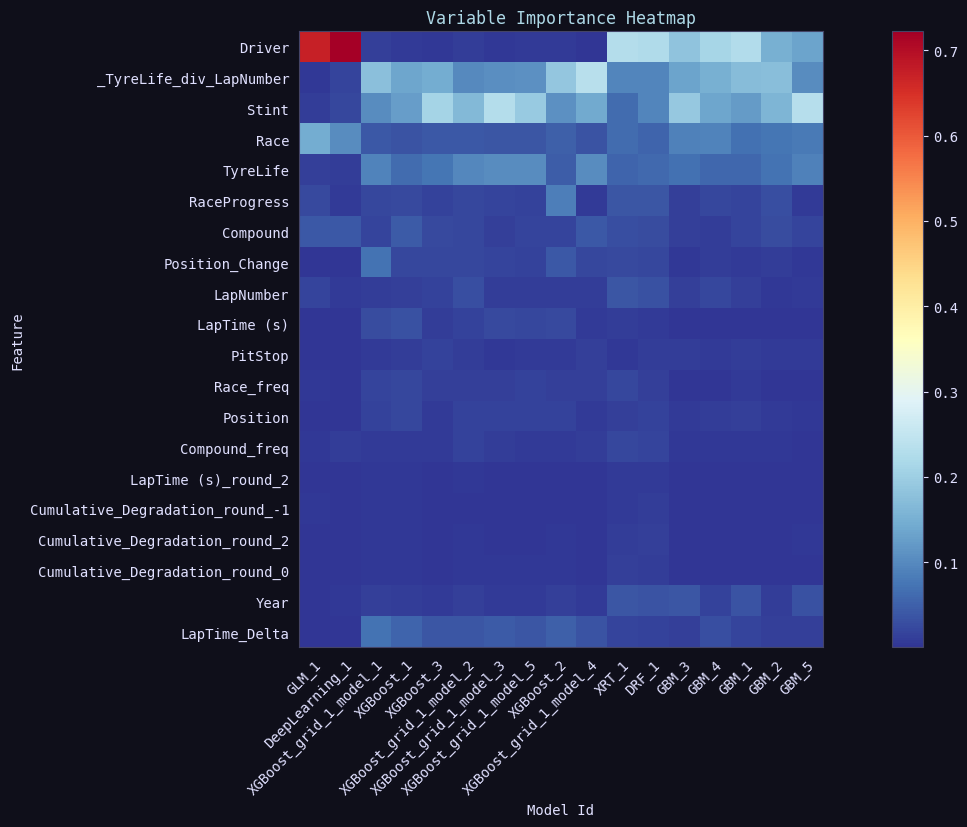

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

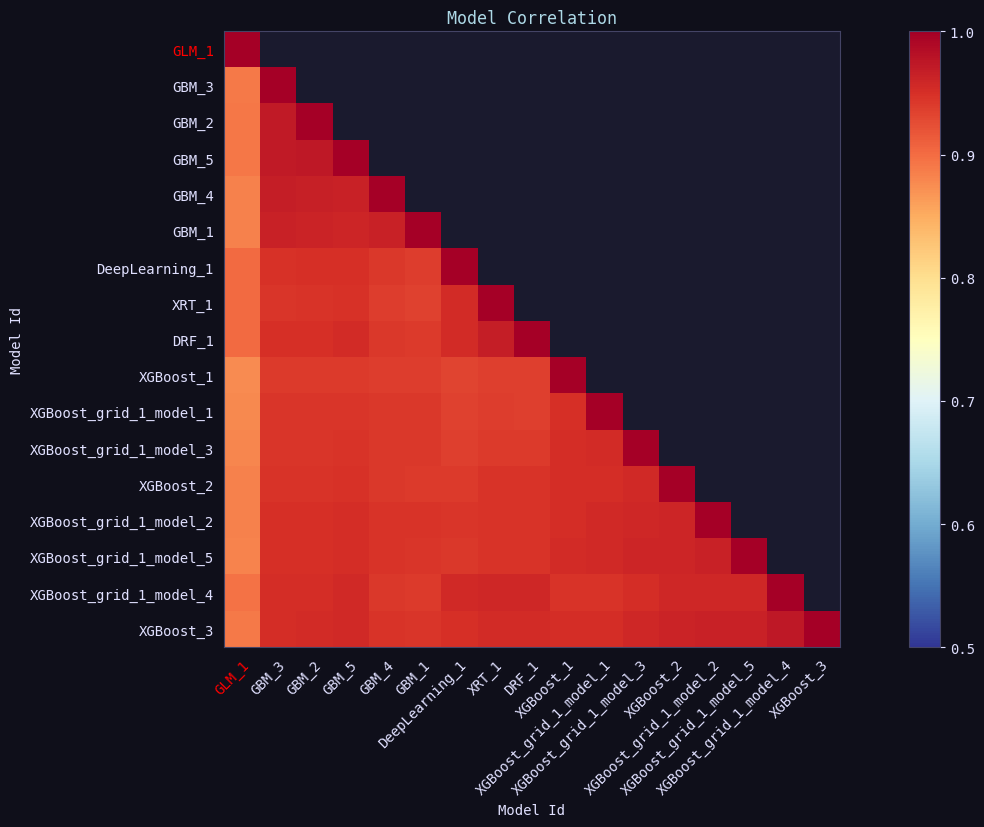

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

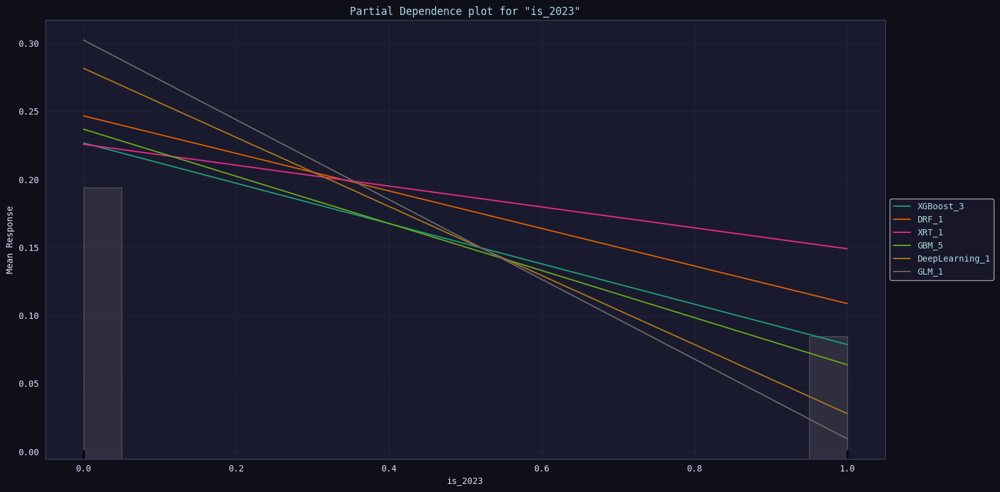

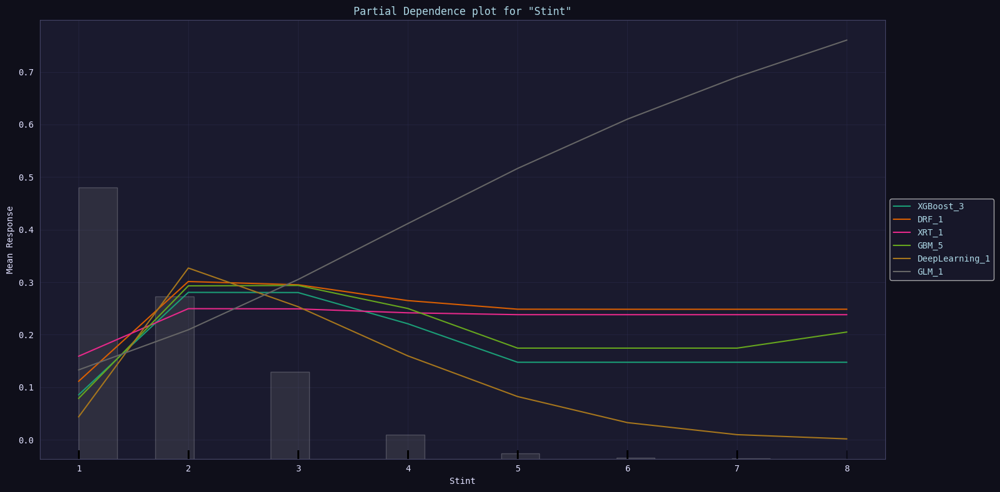

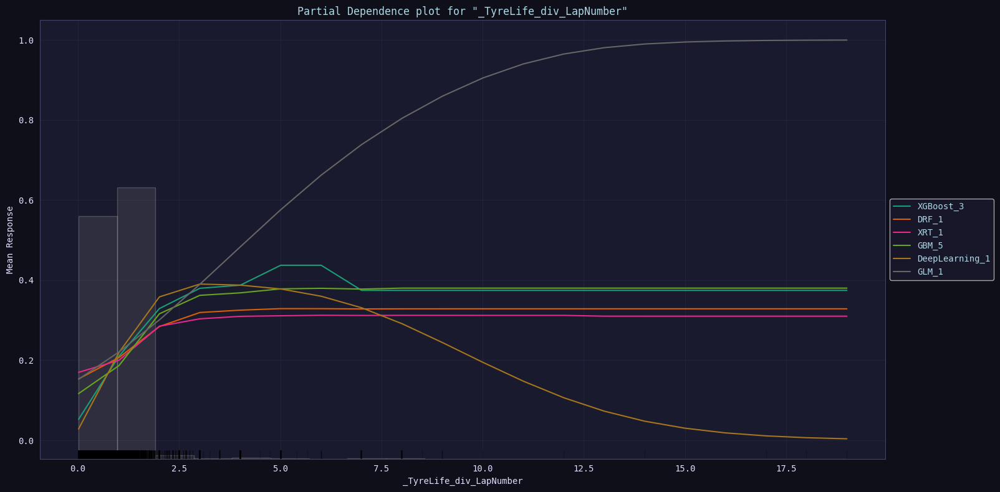

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse,training_time_ms,predict_time_per_row_ms,algo
XGBoost_grid_1_AutoML_5_20260524_222706_model_5,0.948472,0.226694,0.808797,0.132412,0.266151,0.0708364,90451,0.00519,XGBoost
XGBoost_2_AutoML_5_20260524_222706,0.948215,0.227488,0.807473,0.126369,0.267095,0.0713397,81380,0.005046,XGBoost
XGBoost_grid_1_AutoML_5_20260524_222706_model_3,0.948078,0.228053,0.805758,0.130156,0.266991,0.0712844,112794,0.005492,XGBoost
XGBoost_grid_1_AutoML_5_20260524_222706_model_2,0.948034,0.227777,0.806729,0.133706,0.267134,0.0713606,161309,0.005086,XGBoost
XGBoost_3_AutoML_5_20260524_222706,0.948022,0.227609,0.809341,0.130416,0.266844,0.0712056,124011,0.006036,XGBoost
XGBoost_1_AutoML_5_20260524_222706,0.94729,0.230644,0.802329,0.132463,0.268948,0.0723332,94257,0.005717,XGBoost
XGBoost_grid_1_AutoML_5_20260524_222706_model_1,0.946694,0.231482,0.801714,0.134461,0.268901,0.0723078,147585,0.005692,XGBoost
XGBoost_grid_1_AutoML_5_20260524_222706_model_4,0.946388,0.231228,0.804983,0.137829,0.268892,0.0723028,203771,0.007479,XGBoost
DRF_1_AutoML_5_20260524_222706,0.942162,0.242071,0.78914,0.139656,0.273334,0.0747114,53505,0.019227,DRF
XRT_1_AutoML_5_20260524_222706,0.941511,0.245029,0.789132,0.140718,0.276095,0.0762286,70527,0.021066,DRF


# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## XGBoost_3_AutoML_5_20260524_222706

,False,True,Error,Rate
False,63934.0,6418.0,0.0912,(6418.0/70352.0)
True,2964.0,14512.0,0.1696,(2964.0/17476.0)
Total,66898.0,20930.0,0.1068,(9382.0/87828.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

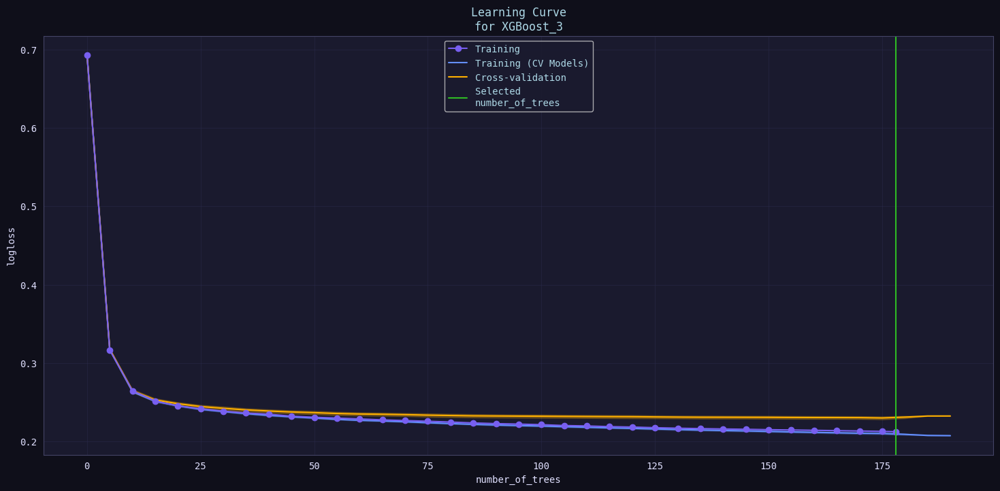

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

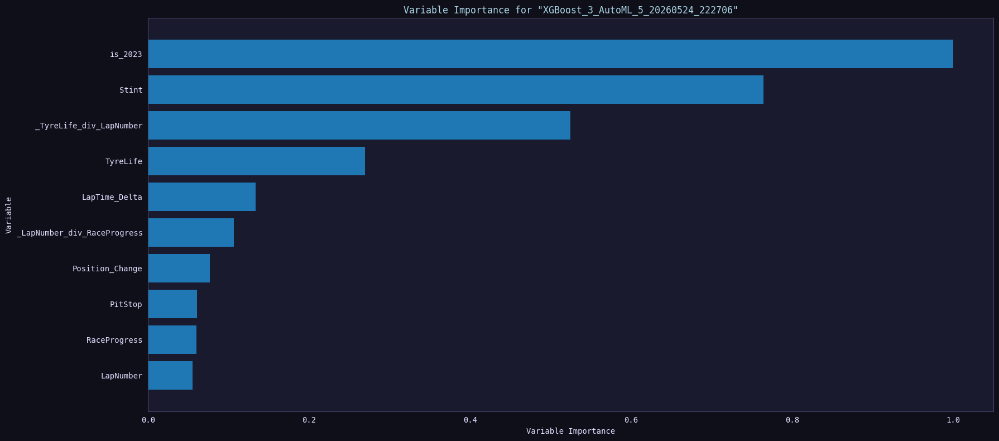

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

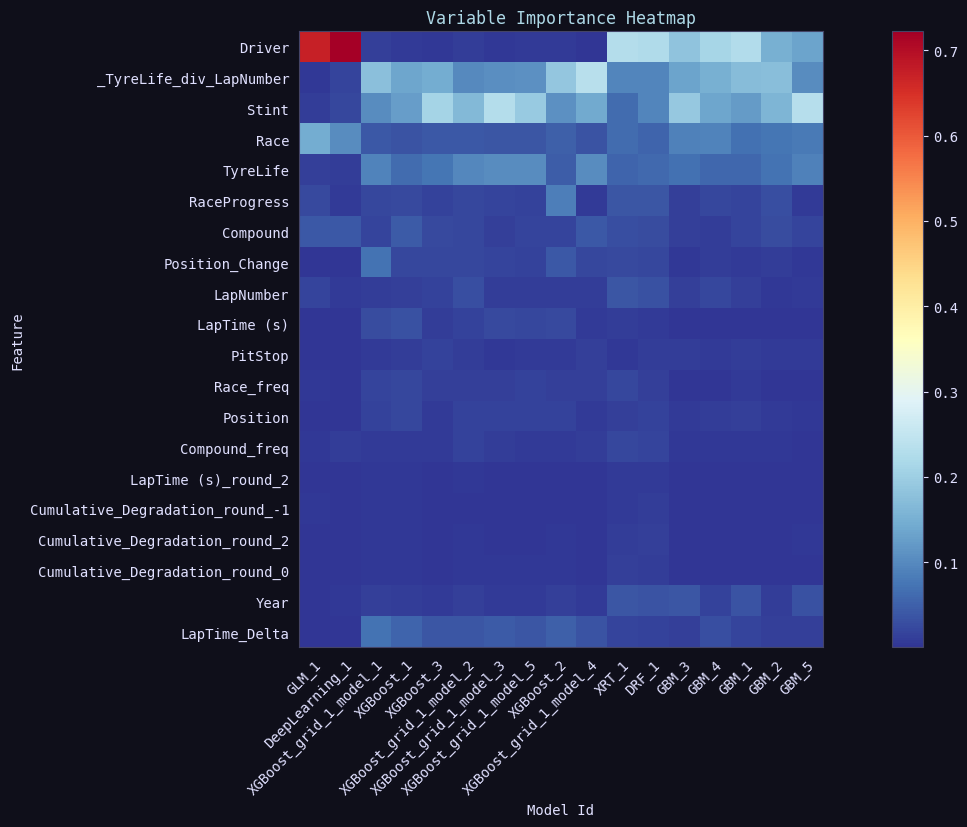

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

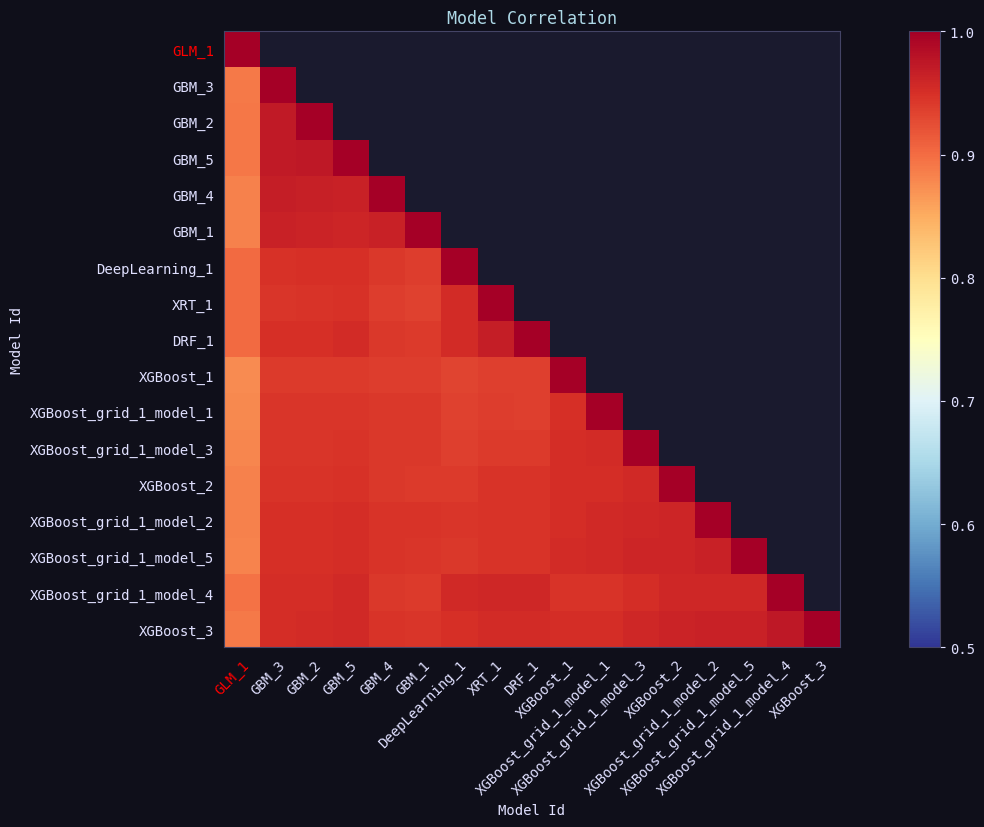

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

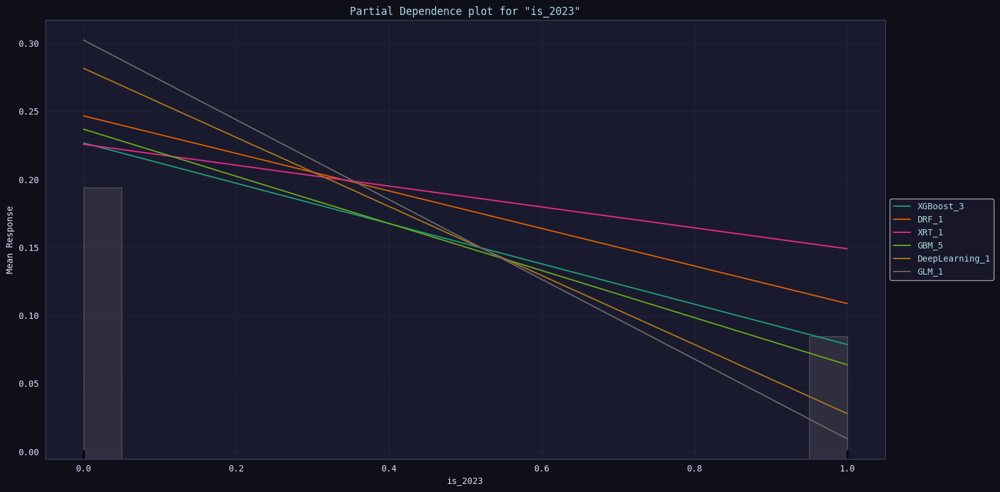

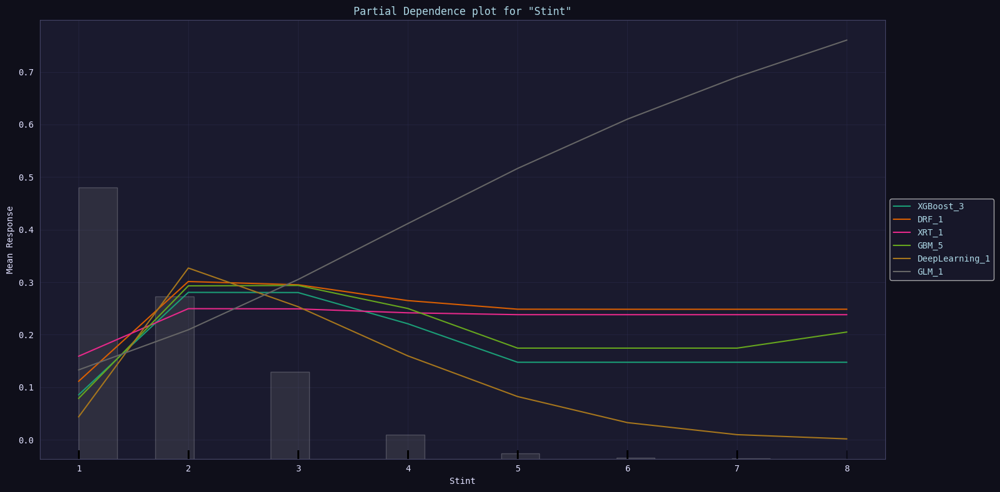

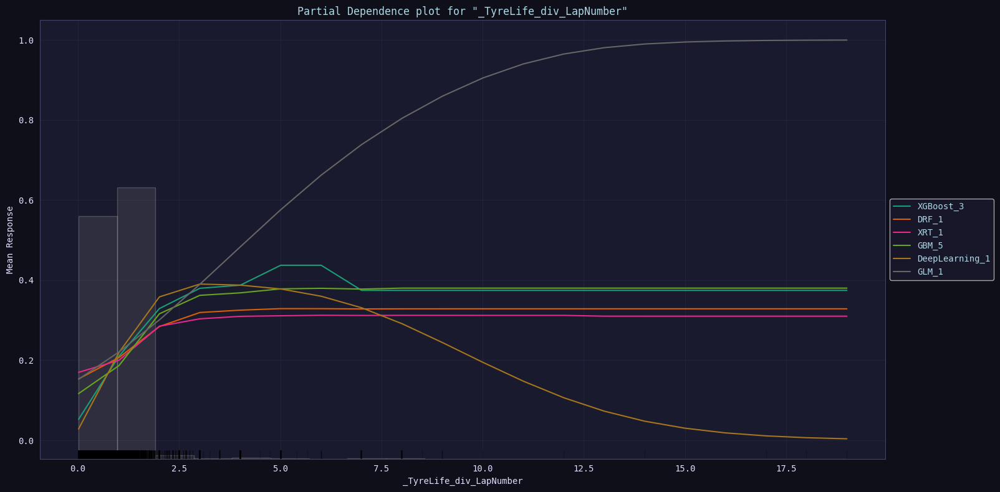

In [39]:
## -- Inspect model and feature importances
get_model = all_model_predictions[list(all_model_predictions.keys())[0]]

get_model['model'].explain(
    get_model['val_data'],
    exclude_explanations=['shap_summary'],
    top_n_features=3,
    figsize=(18, 8),
)

## --- OR ----- ##

# h2o.explain(get_model['model'], get_model['val_data'], top_n_features=3,
#             figsize=(18, 8), exclude_explanations=['shap_summary'])

# HILLCLIMB

In [40]:
try:
    from hillclimbers import climb_hill, partial
except:
    %pip install -q -U hillclimbers
    from hillclimbers import climb_hill, partial

## -- Load data --
oof_df = pd.DataFrame()
test_df = pd.DataFrame()

print('Loading data: ', end='')
for (root, dirs, files) in os.walk('/kaggle/working'):
    for i, file in enumerate(sorted(files), 1):
        if i%5 == 0: print(f'{i}%.. ', end='')
        if file.endswith('.npy') and 'oof' in file:
            oof_df = pd.concat([oof_df, pd.Series(np.load(os.path.join(root, file)),
                                name=file[4:-4])], axis=1)
        elif file.endswith('.npy') and 'test' in file:
            test_df = pd.concat([test_df, pd.Series(np.load(os.path.join(root, file)),
                                name=file[5:-4])], axis=1)

## -- Using ONLY best from each algorithm group --
oof_df  = oof_df[oof_df.columns[-5:]]
test_df = test_df[test_df.columns[-5:]]

print(CFG.YELLOW)
print(f"OOF  loaded : {len(oof_df.shape)}")
print(f"TEST loaded : {len(test_df.shape)}")

display(oof_df.head())
display(test_df.head())

  Preparing metadata (setup.py) ... done
Note: you may need to restart the kernel to use updated packages.
Loading data: 5%.. 10%.. 
OOF  loaded : 2
TEST loaded : 2


,h2o_cv1_deeplearning,h2o_cv1_drf,h2o_cv1_gbm,h2o_cv1_glm,h2o_cv1_xgboost
0,8.272468e-01,0.716998,0.755153,0.756447,0.705788
1,1.195058e-01,0.543978,0.358539,0.200446,0.469433
2,4.653303e-01,0.535781,0.522409,0.685397,0.723740
3,9.286689e-09,0.000241,0.001745,0.001738,0.000938
4,1.333907e-01,0.278532,0.230807,0.381207,0.208378


,h2o_cv1_deeplearning,h2o_cv1_drf,h2o_cv1_gbm,h2o_cv1_glm,h2o_cv1_xgboost
0,0.000744,0.000102,0.000377,0.000930,0.000966
1,0.000721,0.000904,0.000742,0.000828,0.000825
2,0.001096,0.002737,0.001768,0.001084,0.000416
3,0.097036,0.047550,0.043491,0.083721,0.075065
4,0.147213,0.213502,0.192027,0.140226,0.181118


In [41]:
%%time

trn = pd.read_csv(PATH+'train.csv').drop(columns=['id'])

pred_hc, oof_hc = climb_hill(
                               train = train_data,
                              target = TARGET,
                         oof_pred_df = oof_df,
                        test_pred_df = test_df,
                           objective = 'maximize',
                         eval_metric = partial(roc_auc_score),
                    # negative_weights = True,
                    return_oof_preds = True,
                           precision = 0.01,
                           plot_hill = True,
                           plot_hist = True,
)

   /\  
  /__\  hillclimbers 
 /    \
/______\ 

Models to be ensembled | (5 total): 

h2o_cv1_xgboost:      0.94774 (best solo model)
h2o_cv1_drf:          0.94166
h2o_cv1_gbm:          0.94013
h2o_cv1_deeplearning: 0.92944
h2o_cv1_glm:          0.89454

[Data preparation completed successfully] - [Initiate hill climbing] 

Iteration: 1 | Model added: h2o_cv1_drf | Best weight: 0.24 | Best roc_auc_score: 0.94858
Iteration: 2 | Model added: h2o_cv1_gbm | Best weight: 0.04 | Best roc_auc_score: 0.94860
Iteration: 3 | Model added: h2o_cv1_deeplearning | Best weight: 0.01 | Best roc_auc_score: 0.94860


CPU times: user 1min 4s, sys: 1.76 s, total: 1min 5s
Wall time: 1min 6s


In [42]:
hc_auc = str(round(roc_auc_score(train_data[TARGET], oof_hc), 5)).split('.')[1]
print(f"Hillclimb score: {hc_auc}")

np.save(f"oof_{version_name}_base_hillclimb_{hc_auc}.npy", oof_hc)
np.save(f"test_{version_name}_base_hillclimb_{hc_auc}.npy", pred_hc)

submit[TARGET] = pred_hc
submit.to_csv(f"submit_{version_name}_base_hillclimb_{hc_auc}.csv", index=False)
print(f"\n✅ Saved hillclimb ensemble!!!")

submit.head(10)

Hillclimb score: 9486

✅ Saved hillclimb ensemble!!!


,id,PitNextLap
0,439140,0.000744
1,439141,0.000839
2,439142,0.001005
3,439143,0.067758
4,439144,0.188597
5,439145,0.070889
6,439146,0.000442
7,439147,0.000646
8,439148,0.005424
9,439149,0.000243
